# 第5章 神经网络和深度学习基础

## 1、一些概念

### 1.1 深度学习、机器学习、神经网络和AI
一些观点认为的机器学习和深度学习的关系：

来源:https://learn.microsoft.com/zh-cn/azure/machine-learning/concept-deep-learning-vs-machine-learning?view=azureml-api-2
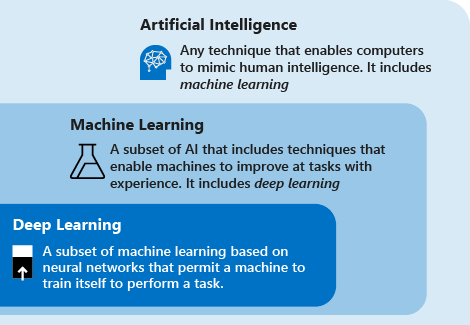

- 深度学习是机器学习的子集，它基于人工神经网络。 学习过程之所以是深度性的，是因为人工神经网络的结构由多个输入、输出和隐藏层构成。 每个层包含的单元可将输入数据转换为信息，供下一层用于特定的预测任务。 得益于这种结构，机器可以通过自身的数据处理进行学习。

- 机器学习是人工智能的子集，它采用可让机器凭借经验在任务中做出改善的技术（例如深度学习）

- 生成式 AI 是人工智能的一部分，可使用深度学习等技术生成新的内容。 例如，可以使用生成式 AI 创建图像、文本或音频。 这些模型利用大量预先训练的知识来生成此内容。


一些观点认为的机器学习、神经网络等的关系：

来源：https://nndl.github.io/

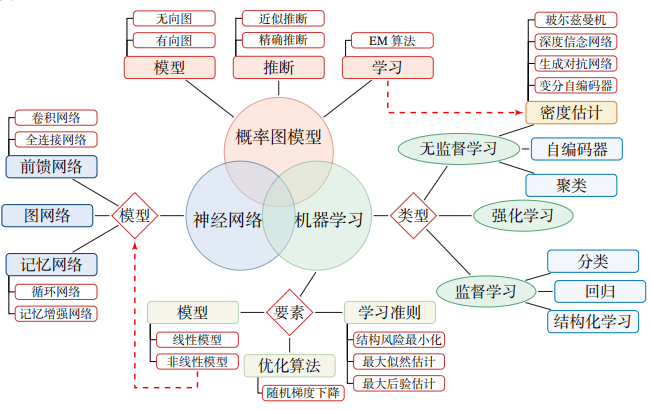






### 1.2 回顾
机器学习的基本流程．对一个预测任务，输入特征向量为 𝒙，输出标签为𝑦，我们选择一个函数集合ℱ，通过学习算法𝒜和一组训练样本𝒟，从ℱ中学习到函数$𝑓^*(𝒙)$．这样对新的输入𝒙，就可以用函数$𝑓^*(𝒙)$进行预测．

来源：https://nndl.github.io/
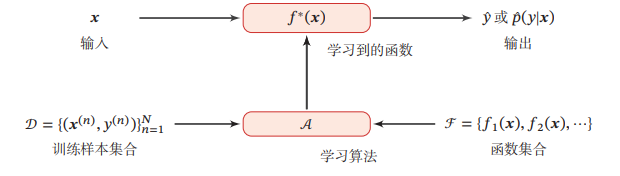

## 1.3 深度学习关心的任务
1.图像识别和分类： 使用深度学习进行图像分类、对象检测和图像分割等任务。这包括识别图像中的物体、场景或人脸。

2.语音识别： 将语音信号转换为文本，使计算机能够理解和处理语音输入。

3.自然语言处理（NLP）： 包括文本分类、命名实体识别、机器翻译、情感分析等任务，使计算机能够理解和生成自然语言。

4.更宽泛的任务:AI4S等

## 1.4 常见的神经网络
神经网络是一类由相互连接的神经元组成的模型，用于模拟人脑的信息处理机制。以下是一些常见的神经网络类型：

1. **前馈神经网络（Feedforward Neural Networks，FNN）：** 是最基本的神经网络类型，信息在网络中单向传播，没有形成循环。有的时候多层前馈神经网络也被称为多层感知机（Multilayer Perceptrons，MLP）。

2. **卷积神经网络（Convolutional Neural Networks，CNN）：** 主要用于图像识别和处理。CNN包括卷积层，池化层和全连接层，通过卷积运算来捕捉图像中的局部特征。

3. **循环神经网络（Recurrent Neural Networks，RNN）：** 具有循环连接的神经网络，可以处理序列数据，如时间序列或自然语言。RNN在处理序列数据时具有记忆能力，但也容易出现梯度消失或梯度爆炸的问题。

4. **长短时记忆网络（Long Short-Term Memory，LSTM）：** 是一种特殊类型的循环神经网络，通过引入门控机制解决了传统RNN的梯度问题，更有效地处理长序列。

5. **生成对抗网络（Generative Adversarial Networks，GAN）：** 包含生成器和判别器两个部分，通过对抗训练的方式生成逼真的数据。主要用于生成新的图像、声音等。

6. **注意力模型（Attention Model）：** 通过对输入的不同部分分配不同的注意权重，使模型能够更好地处理长序列或复杂结构的数据。

7. **图神经网络（Graph Neural Networks，GNN）：** 用于处理图形数据，如社交网络、分子结构等。GNN通过学习节点和边的表示来捕捉图形结构，它在处理不规则和非结构化数据方面表现出色。


................
等等等等

## 1.5 本讲的主题
1.MLP

2.CNN

## 1.6本讲的特点
1.入门为主，有点像科普


2.内容较为浅显，数学少


3.希望达到的目的是直观

## 2、一些资源
### 课程
CS231  CS224 斯坦福大学 
分别从计算机视觉和自然语言处理两个角度来讲授深度学习的基础知识和最新进展。
### 论文
CCF A/B 会议推荐

## 3、MLP
### 3.1 一个神经网络如何工作

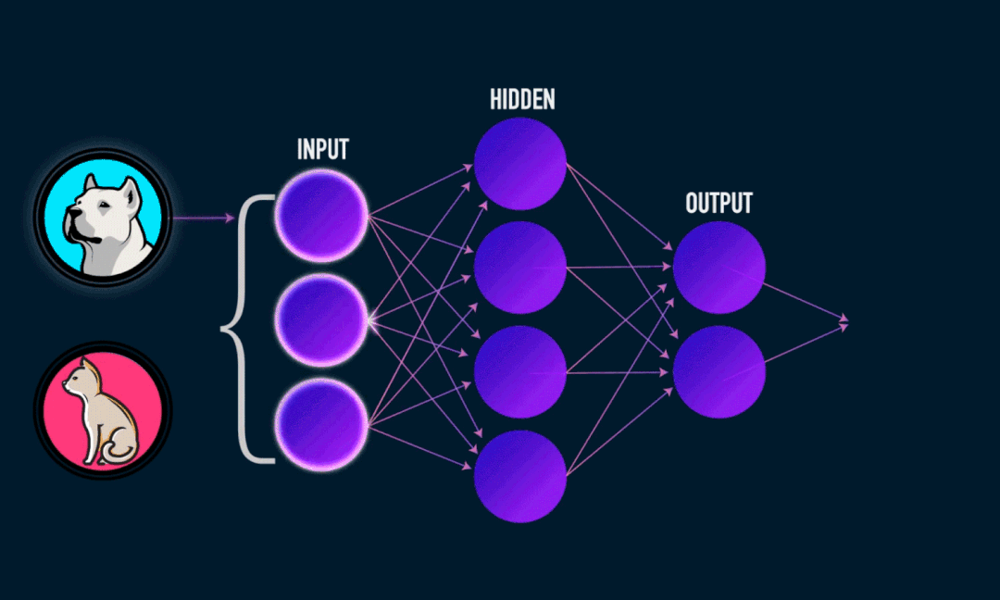

In [2]:
from IPython.display import display, Image

# 定义GIF文件路径
gif_path = "./pics/cat-dog.gif"

# 显示GIF图像
display(Image(filename=gif_path))

## 3.1.2 从一个一个简单的MLP说起


In [8]:
import torch.nn as nn
import torch.nn.functional as F
import torch.nn.init as init

class MLP_cls(nn.Module):
    def __init__(self,in_dim=28*28):
        super(MLP_cls,self).__init__()
        self.lin1 = nn.Linear(in_dim,64)
        self.lin2 = nn.Linear(64,32)
        self.fc = nn.Linear(32,10)
        self.relu = nn.ReLU()

    def forward(self,x):
        x = x.view(-1,28*28)#28*28=784
        x = self.lin1(x)
        x = self.relu(x)
        x = self.lin2(x)
        x = self.relu(x)
        x = self.fc(x)
        x = self.relu(x)
        return x

网络结构:(示例)

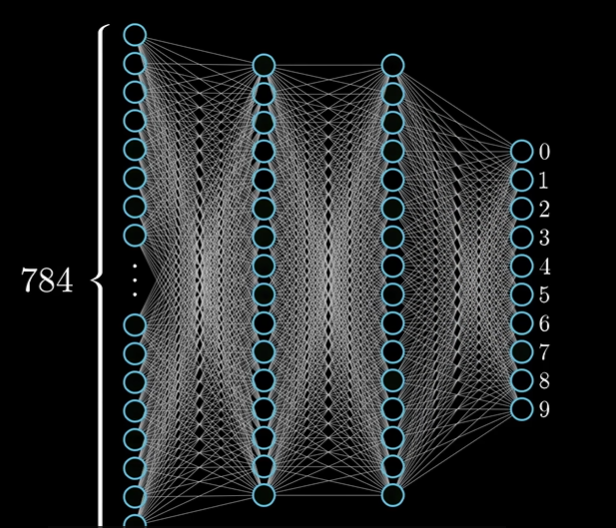

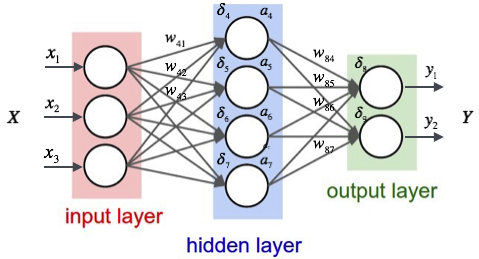


生物学和数学结构：
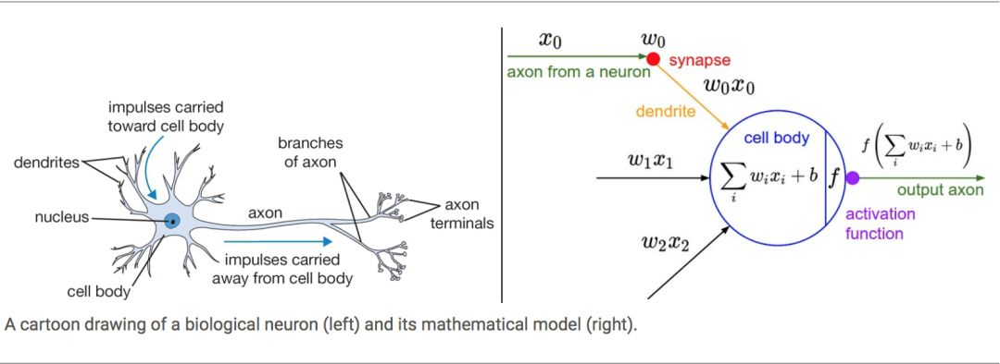


我们所关心的问题：
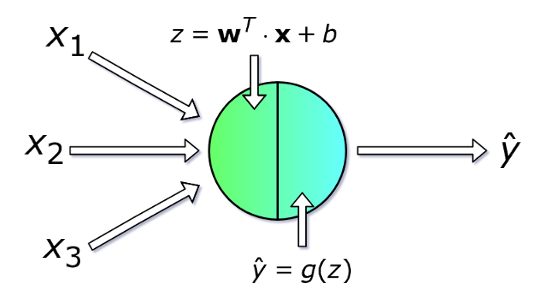






输入：X    ->**传入数据**                      x = x.view(-1,28*28)

中间产生:Z ->**可学习权重参数W**和**偏置b**     self.lin1 = nn.Linear(in_dim,32)

输出:Y     ->**激活函数**   x = self.relu(x)

    
Y作为新的X,循环往复                      

什么时候这个传播过程截止？


**全连接层和输出**                        self.fc = nn.Linear(32,10)

补充：激活函数
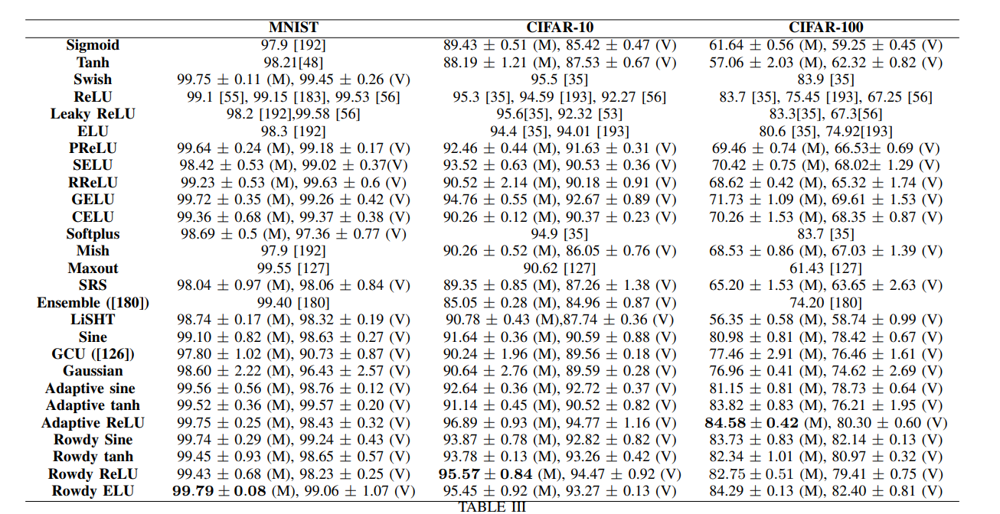
https://arxiv.org/pdf/2209.02681.pdf

为什么要激活函数？
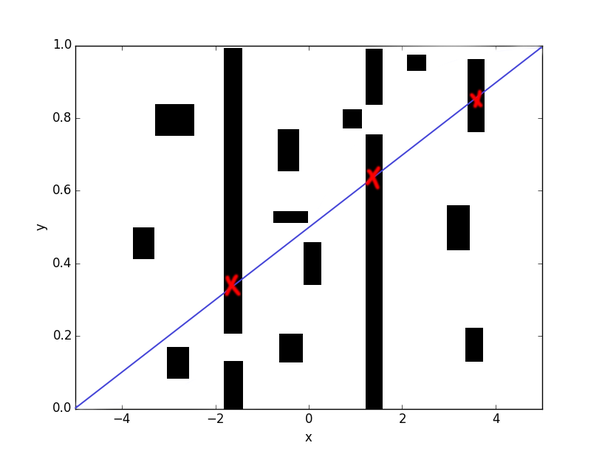
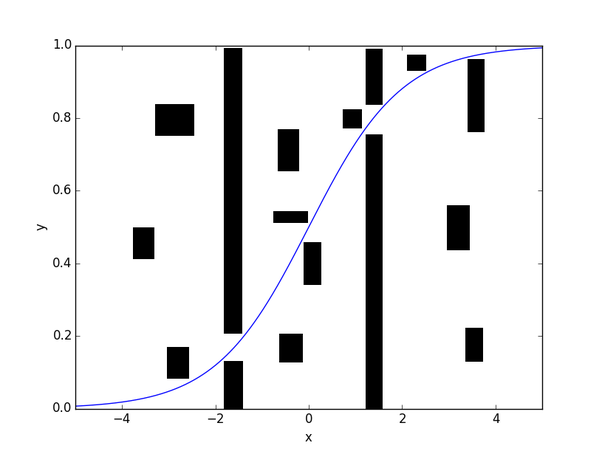
https://www.quora.com/Why-do-neural-networks-need-an-activation-function

### 前向传播
输入：
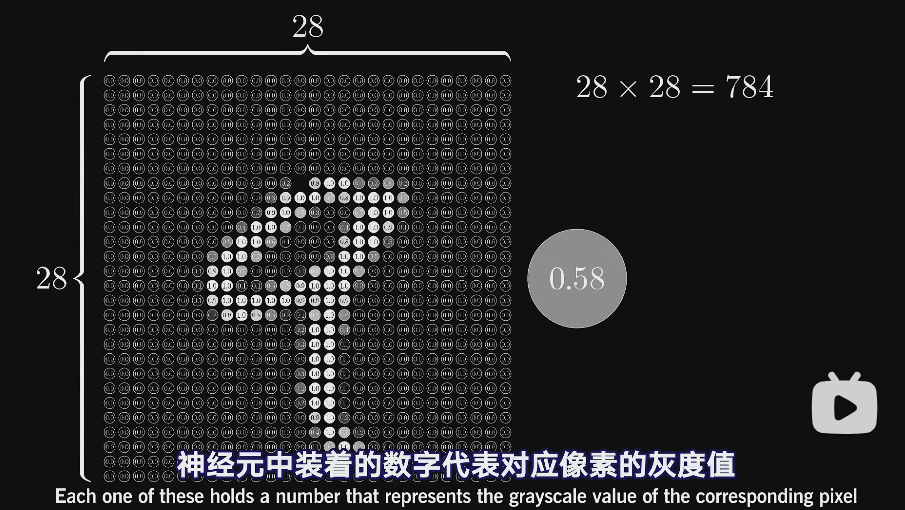


前向传播这个过程怎么进行？https://www.youtube.com/watch?v=aircAruvnKk


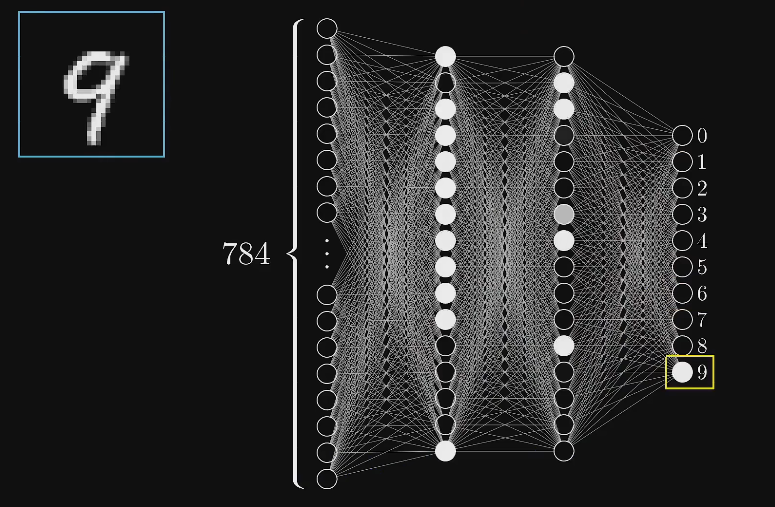


视频9:11
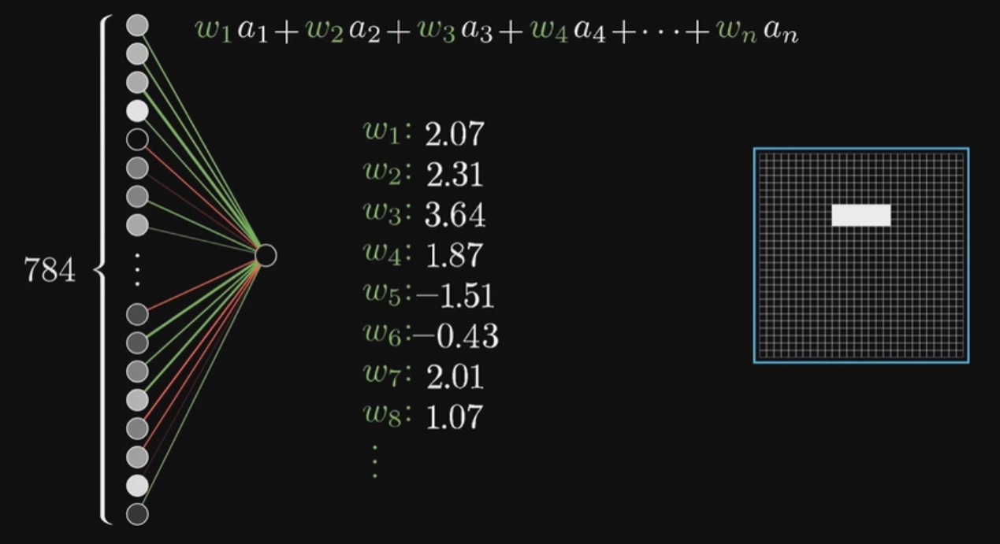



矩阵化:视频13:50
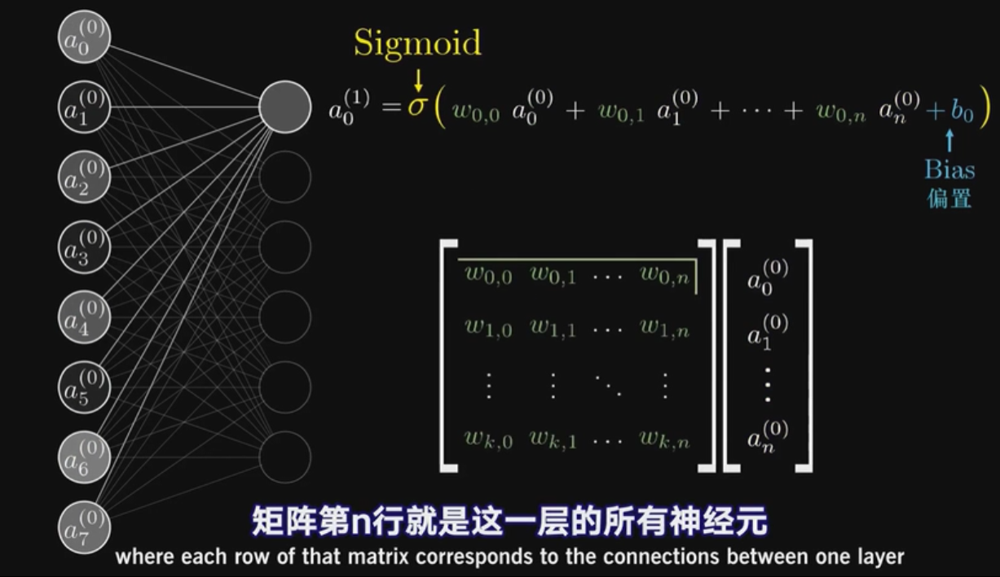



### 反向传播：
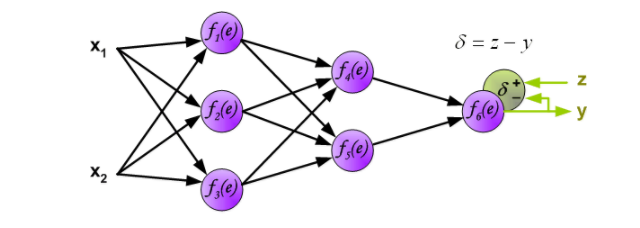

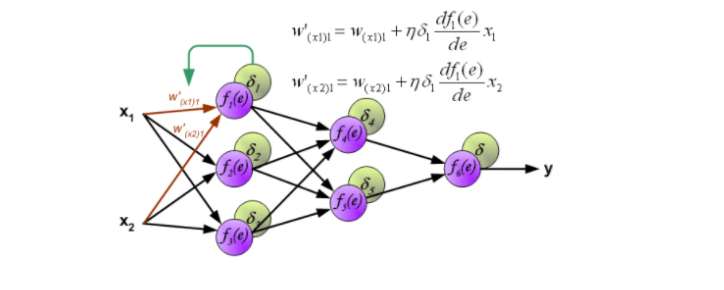

回忆梯度下降：

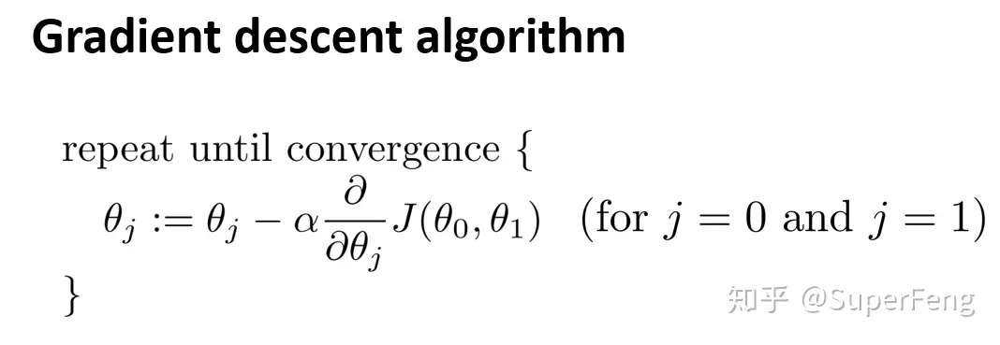

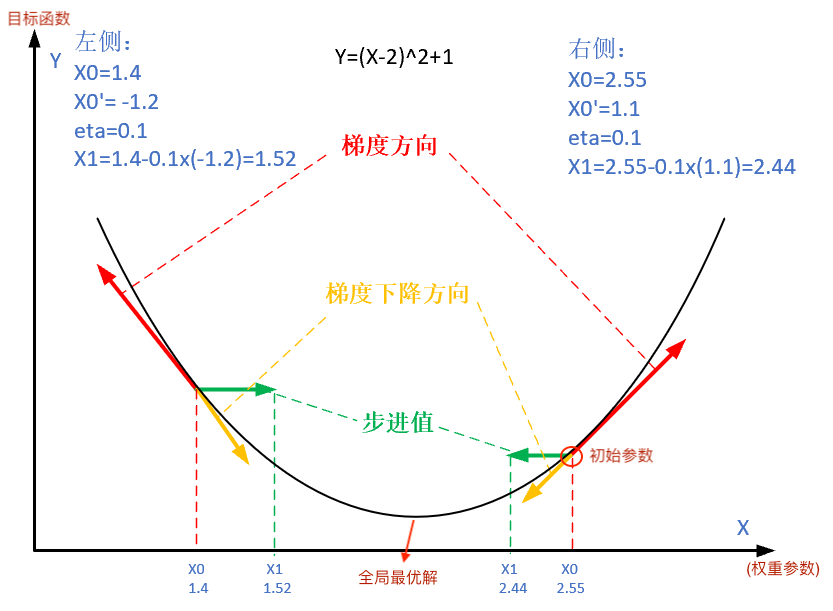

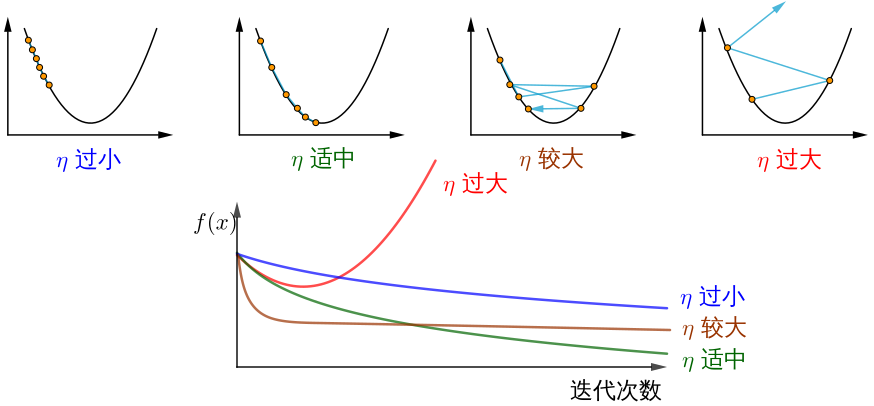

https://developer.huawei.com/consumer/cn/forum/topic/0204113585917496624



代价函数：
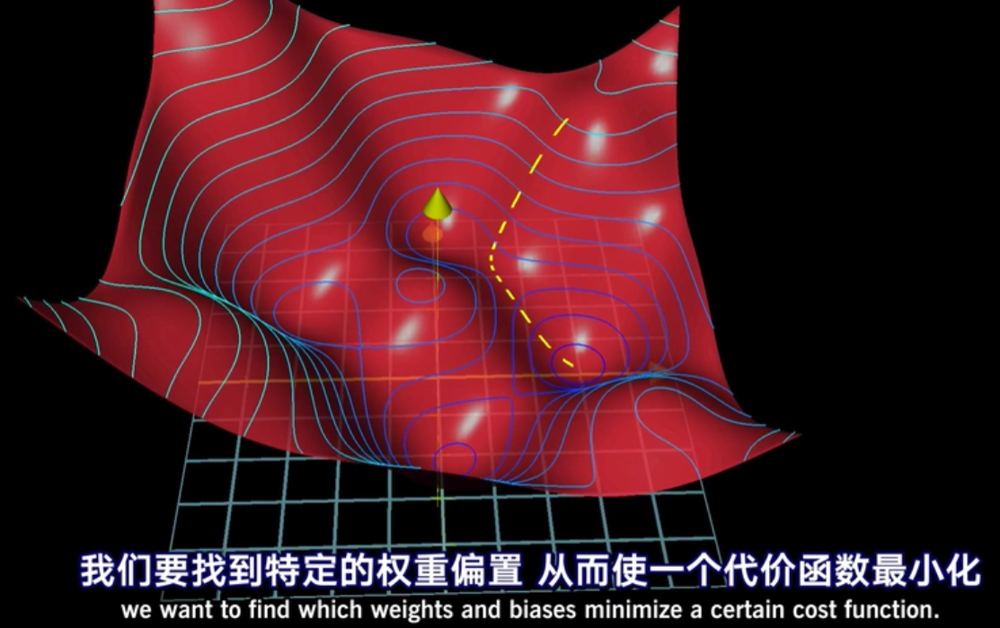

如何反向传播? 

https://www.bilibili.com/video/BV16x411V7Qg/


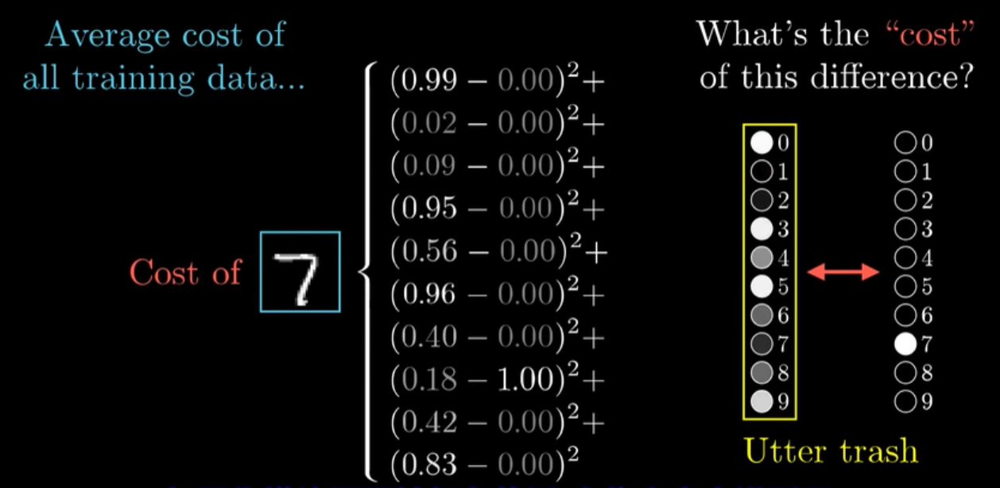




最后一层很简单，后面的层应该怎么求？

**链式法则**

举例：
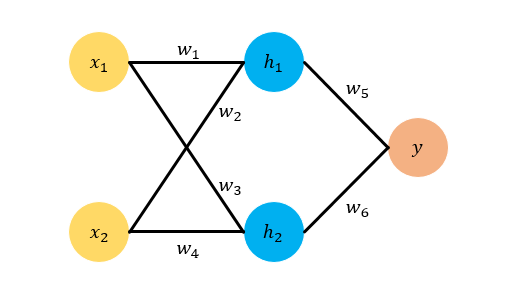

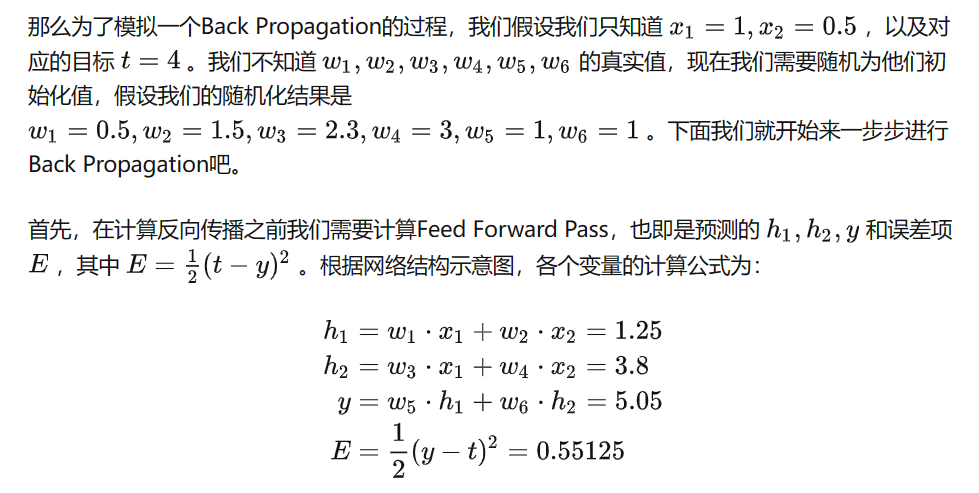


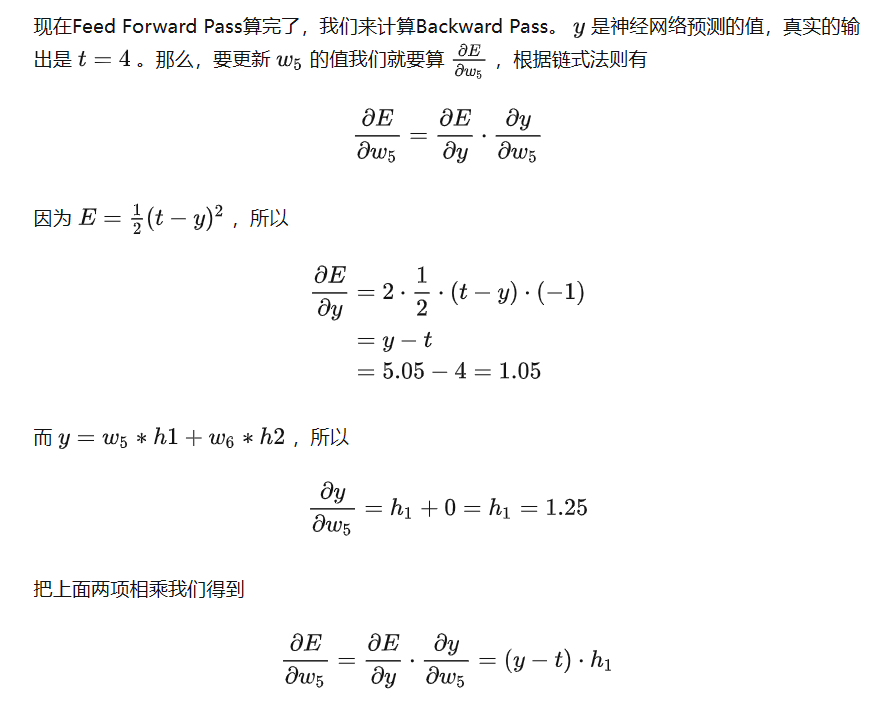

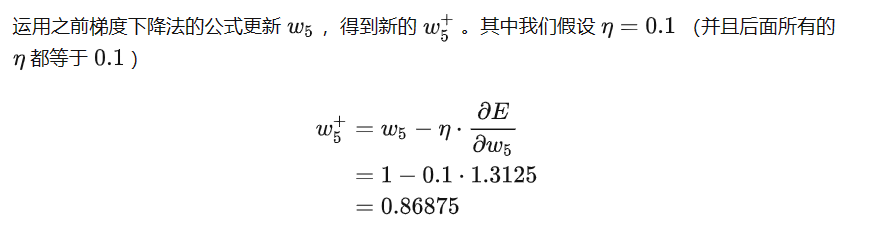
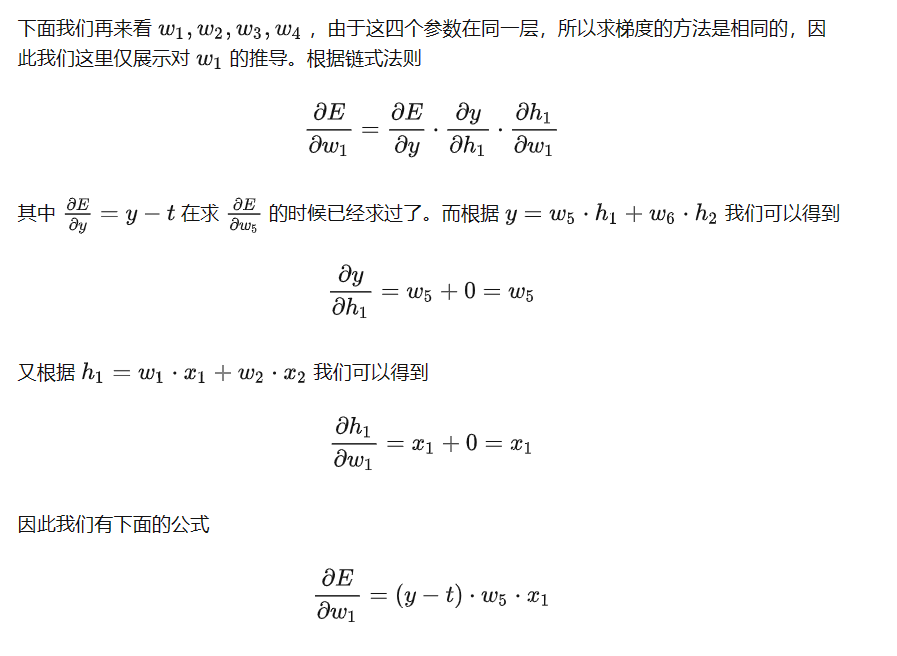
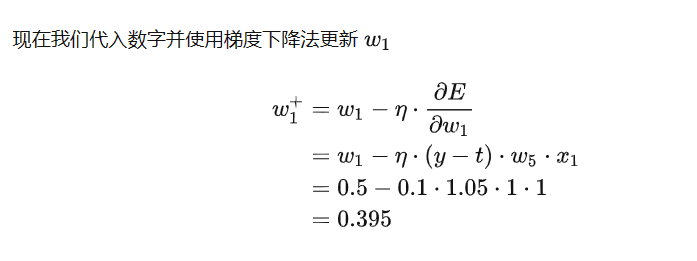
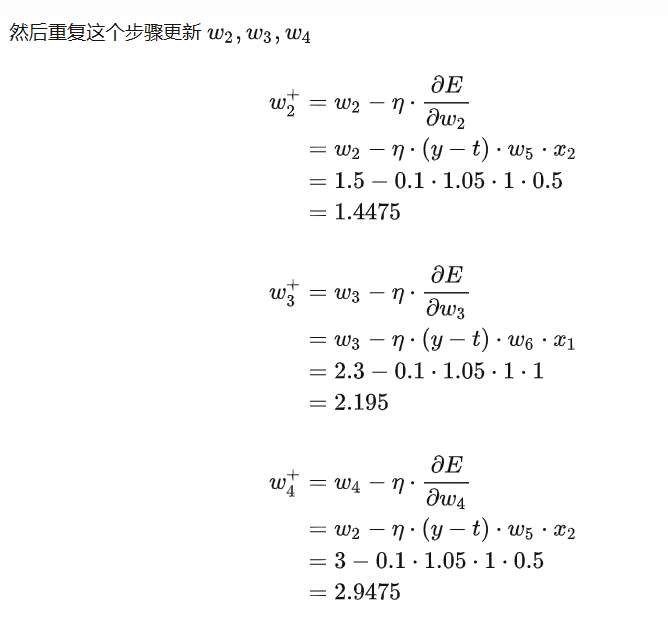



https://zhuanlan.zhihu.com/p/40378224

### 训练一个MLP:

In [1]:
import torch.nn as nn
import torch.nn.functional as F
import torch.nn.init as init

class MLP_cls(nn.Module):
    def __init__(self,in_dim=28*28):
        super(MLP_cls,self).__init__()
        self.lin1 = nn.Linear(in_dim,64)
        self.lin2 = nn.Linear(64,32)
        self.fc = nn.Linear(32,10)
        self.relu = nn.ReLU()

    def forward(self,x):
        x = x.view(-1,28*28)#28*28=784
        x = self.lin1(x)
        x = self.relu(x)
        x = self.lin2(x)
        x = self.relu(x)
        x = self.fc(x)
        x = self.relu(x)
        return x

In [2]:
import torch
import torch.nn as nn
import torchvision
from torch.utils.data import DataLoader
import torch.optim as optim
#from model import MLP_cls


seed = 42
torch.manual_seed(seed)
batch_size_train = 64
batch_size_test  = 64
epochs = 10
learning_rate = 0.01
momentum = 0.5
mlp_net = MLP_cls()

train_loader = torch.utils.data.DataLoader(
    torchvision.datasets.MNIST('./data/', train=True, download=True,
                               transform=torchvision.transforms.Compose([
                                   torchvision.transforms.ToTensor(),
                                   torchvision.transforms.Normalize(
                                       (0.5,), (0.5,))
                               ])),
    batch_size=batch_size_train, shuffle=True)
test_loader = torch.utils.data.DataLoader(
    torchvision.datasets.MNIST('./data/', train=False, download=True,
                               transform=torchvision.transforms.Compose([
                                   torchvision.transforms.ToTensor(),
                                   torchvision.transforms.Normalize(
                                       (0.5,), (0.5,))
                               ])),
    batch_size=batch_size_test, shuffle=True)

optimizer = optim.SGD(mlp_net.parameters(), lr=learning_rate,momentum=momentum)
criterion = nn.CrossEntropyLoss()

print("****************Begin Training****************")
mlp_net.train()
for epoch in range(epochs):
    run_loss = 0
    correct_num = 0
    for batch_idx, (data, target) in enumerate(train_loader):
        out = mlp_net(data)
        _,pred = torch.max(out,dim=1)
        optimizer.zero_grad()
        loss = criterion(out,target)
        loss.backward()
        run_loss += loss
        optimizer.step()
        correct_num  += torch.sum(pred==target)
    print('epoch',epoch+1,'loss {:.2f}'.format(run_loss.item()/len(train_loader)),'accuracy {:.2f}'.format(correct_num.item()/(len(train_loader)*batch_size_train)))



print("****************Begin Testing****************")
mlp_net.eval()
test_loss = 0
test_correct_num = 0
for batch_idx, (data, target) in enumerate(test_loader):
    out = mlp_net(data)
    _,pred = torch.max(out,dim=1)
    test_loss += criterion(out,target)
    test_correct_num  += torch.sum(pred==target)
print('loss {:.2f}'.format(test_loss.item()/len(test_loader)),'accuracy {:.2f}'.format(test_correct_num.item()/(len(test_loader)*batch_size_test)))


****************Begin Training****************
epoch 1 loss 1.38 accuracy 0.56
epoch 2 loss 0.95 accuracy 0.66
epoch 3 loss 0.77 accuracy 0.72
epoch 4 loss 0.73 accuracy 0.73
epoch 5 loss 0.69 accuracy 0.74
epoch 6 loss 0.67 accuracy 0.74
epoch 7 loss 0.65 accuracy 0.75
epoch 8 loss 0.63 accuracy 0.75
epoch 9 loss 0.62 accuracy 0.75
epoch 10 loss 0.61 accuracy 0.76
****************Begin Testing****************
loss 0.61 accuracy 0.75


## 4.CNN

卷积神经网络


什么是卷积和卷积运算？


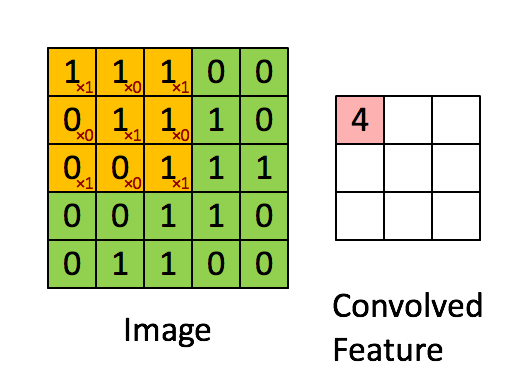

In [3]:
from IPython.display import display, Image

gif_path = "./pics/cnn.gif"

display(Image(filename=gif_path))

再来看一个例子：
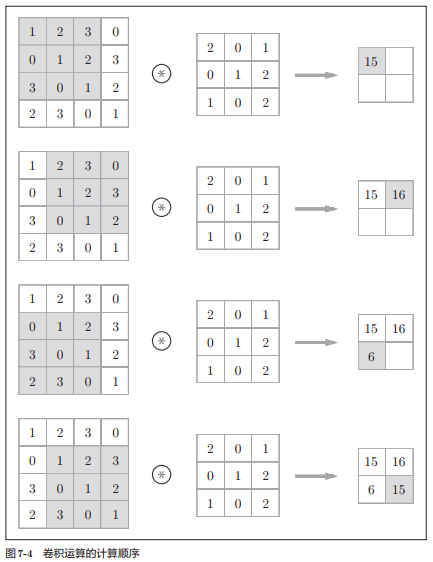

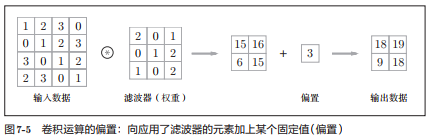

https://www.cnblogs.com/jyroy/p/13762902.html

三维的卷积(彩色图像)
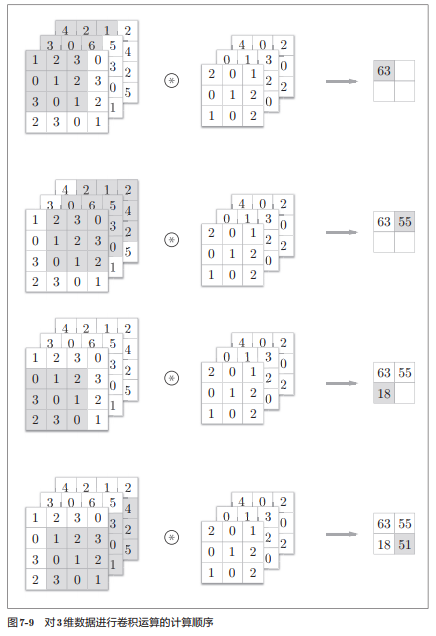

什么是填充操作？
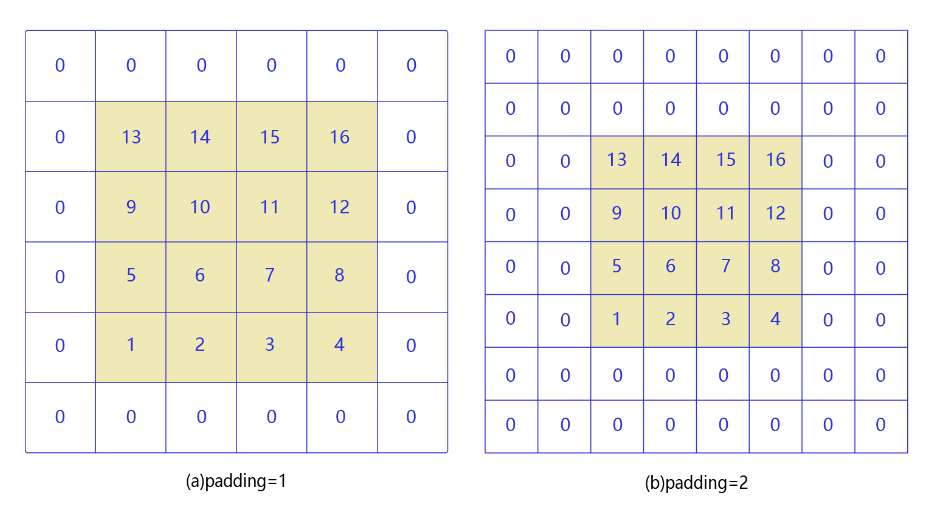

padding的作用：

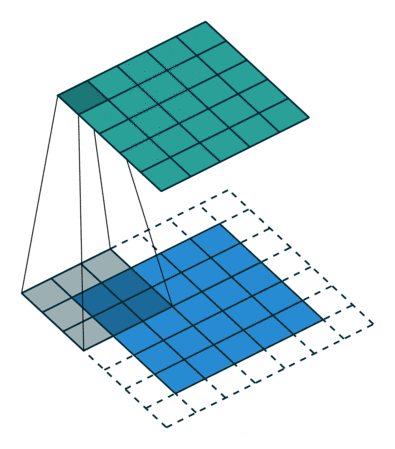

In [4]:
from IPython.display import display, Image

gif_path = "./pics/padding.gif"

display(Image(filename=gif_path))

步长选取：步幅为2的卷积过程
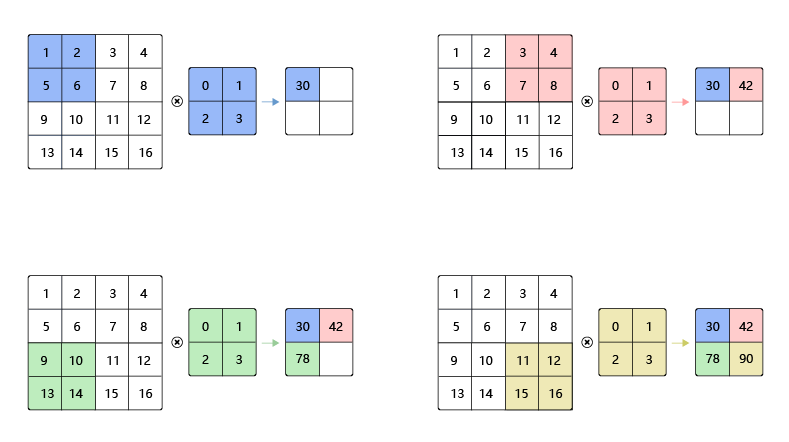

什么是池化操作？
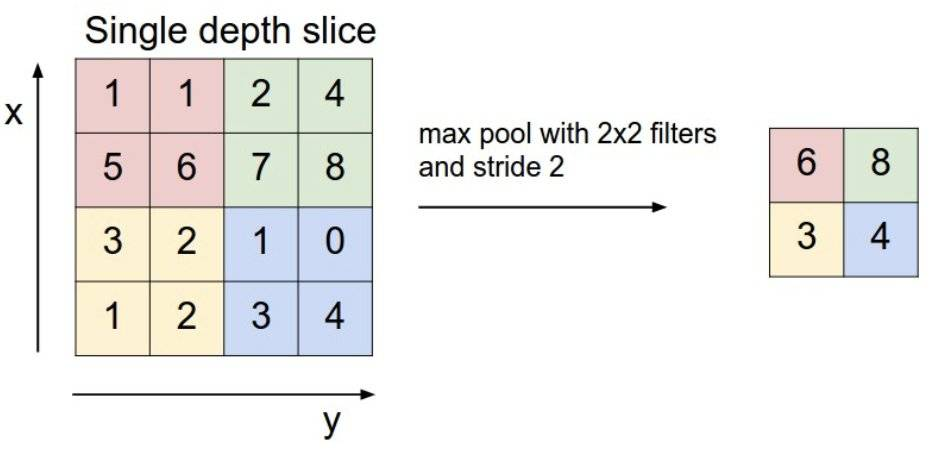

两种不同的池化：
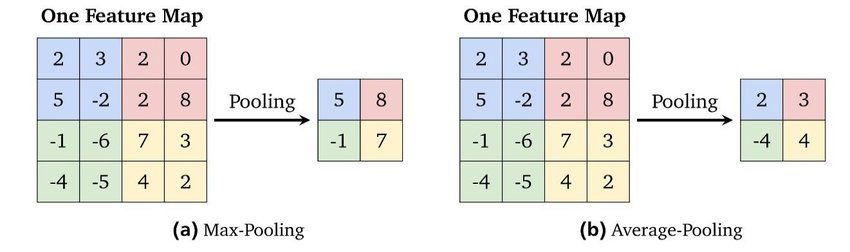

卷积神经网络结构：
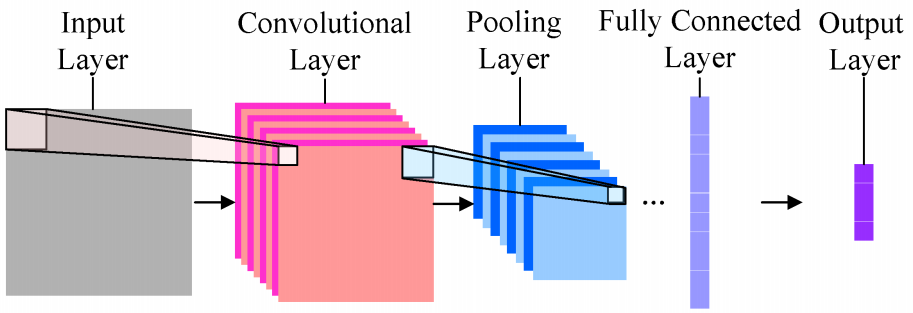

举例：LeNet-5

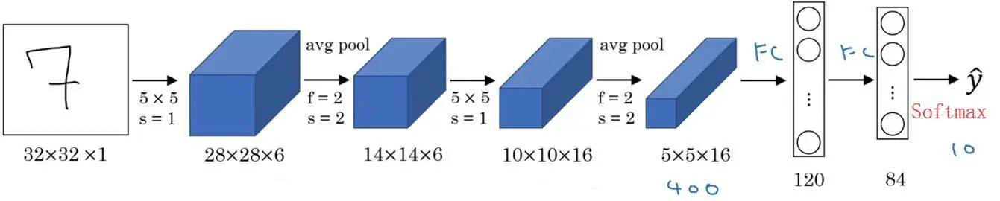

举例：VGG
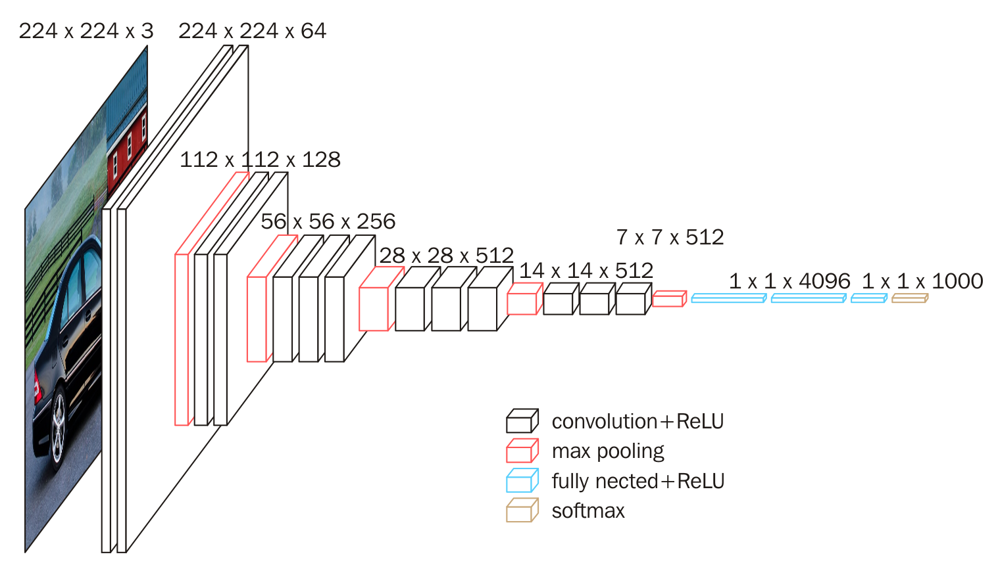






可视化: https://www.bilibili.com/video/BV1Vd4y1e7pj


视频9:00
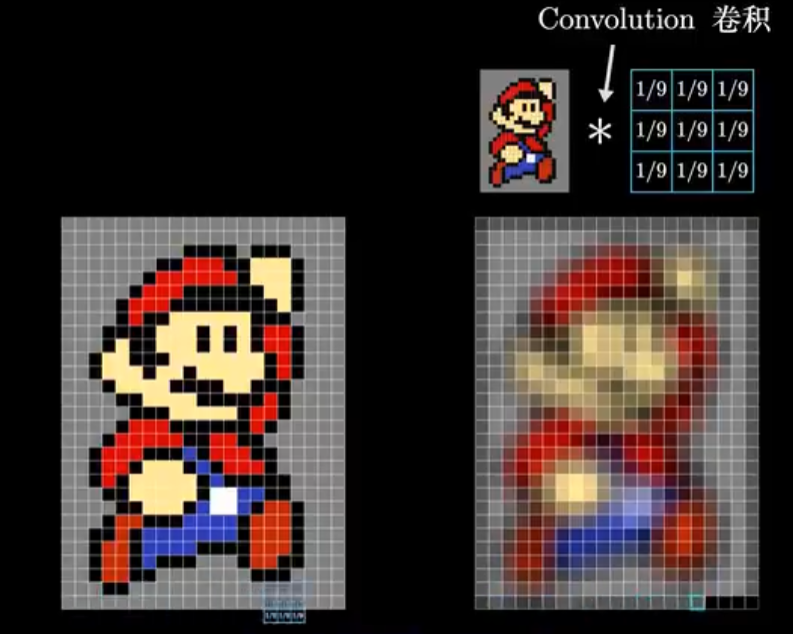



写一个简单的CNN

In [5]:
import torch.nn as nn
class CNN_cls(nn.Module):
    def __init__(self,in_dim=28*28):
        super(CNN_cls,self).__init__()
        self.conv1 = nn.Conv2d(1,32,1,1)
        self.pool1 = nn.MaxPool2d(2,2)
        self.conv2 = nn.Conv2d(32,64,1,1)
        self.pool2 = nn.MaxPool2d(2,2)
        self.conv3 = nn.Conv2d(64,128,1,1)
        self.lin1 = nn.Linear(128*7*7,512)
        self.lin2 = nn.Linear(512,64)
        self.lin3 = nn.Linear(64,10)
        self.relu = nn.ReLU()

    def forward(self,x):
        x = self.conv1(x)
        x = self.relu(x)
        x = self.pool1(x)
        x = self.conv2(x)
        x = self.relu(x)
        x = self.pool2(x)
        x = self.conv3(x)
        x = self.relu(x)
        x = x.view(-1,128*7*7)
        x = self.lin1(x)
        x = self.relu(x)
        x = self.lin2(x)
        x = self.relu(x)
        x = self.lin3(x)
        return x

In [ ]:
import torch
import torch.nn as nn
import torchvision
from torch.utils.data import DataLoader
import torch.optim as optim
#from model import CNN_cls


seed = 42
torch.manual_seed(seed)
batch_size_train = 64
batch_size_test  = 64
epochs = 10
learning_rate = 0.01
momentum = 0.5
net = CNN_cls()

train_loader = torch.utils.data.DataLoader(
    torchvision.datasets.MNIST('./data/', train=True, download=True,
                               transform=torchvision.transforms.Compose([
                                   torchvision.transforms.ToTensor(),
                                   torchvision.transforms.Normalize(
                                       (0.5,), (0.5,))
                               ])),
    batch_size=batch_size_train, shuffle=True)
test_loader = torch.utils.data.DataLoader(
    torchvision.datasets.MNIST('./data/', train=False, download=True,
                               transform=torchvision.transforms.Compose([
                                   torchvision.transforms.ToTensor(),
                                   torchvision.transforms.Normalize(
                                       (0.5,), (0.5,))
                               ])),
    batch_size=batch_size_test, shuffle=True)

optimizer = optim.SGD(net.parameters(), lr=learning_rate,momentum=momentum)
criterion = nn.CrossEntropyLoss()

print("****************Begin Training****************")
net.train()
for epoch in range(epochs):
    run_loss = 0
    correct_num = 0
    for batch_idx, (data, target) in enumerate(train_loader):
        out = net(data)
        _,pred = torch.max(out,dim=1)
        optimizer.zero_grad()
        loss = criterion(out,target)
        loss.backward()
        run_loss += loss
        optimizer.step()
        correct_num  += torch.sum(pred==target)
    print('epoch',epoch,'loss {:.2f}'.format(run_loss.item()/len(train_loader)),'accuracy {:.2f}'.format(correct_num.item()/(len(train_loader)*batch_size_train)))



print("****************Begin Testing****************")
net.eval()
test_loss = 0
test_correct_num = 0
for batch_idx, (data, target) in enumerate(test_loader):
    out = net(data)
    _,pred = torch.max(out,dim=1)
    test_loss += criterion(out,target)
    test_correct_num  += torch.sum(pred==target)
print('loss {:.2f}'.format(test_loss.item()/len(test_loader)),'accuracy {:.2f}'.format(test_correct_num.item()/(len(test_loader)*batch_size_test)))

****************Begin Training****************
epoch 0 loss 1.30 accuracy 0.59
epoch 1 loss 0.38 accuracy 0.87
epoch 2 loss 0.26 accuracy 0.92
epoch 3 loss 0.21 accuracy 0.93
epoch 4 loss 0.18 accuracy 0.94
epoch 5 loss 0.16 accuracy 0.95
epoch 6 loss 0.15 accuracy 0.95
epoch 7 loss 0.14 accuracy 0.95
